# FORECASTING CASE STUDY - RETAILER X (ANISH)


## Instructions

**The following case study is intended to test how you would structure a solution for demand forecasting.**

You have been given a dataset for a retailer X who has stores across the country. Please suggest an approach or design a mix of approaches for forecasting sales at the category store week level.

 
**Data available :**

    1).   Macro_Economic_Data - Outlet	YEARWK	Temp	Gas_price_in_dollars 
    Consumer_price_Index	UnEmployment_rate

    2).   Outlets -  Outlet Outlet_Type Floor_Size

    3).   Holiday_Calendar - YEARWK	Is_A_Holiday_Flag

    4).   Heirarchy -  Dept	Category

    5).   Train data - Outlet	Category	YEARWK	Weekly_Sales

    6).   Test Data - Store	Category	YEARWK


There may be different types of time series - Stable, Sporadic, With lesser weeks of history etc. Please walk us through your approach to solve the exercise for both short term forecasting (<=6 weeks) and long term forecasting (6+ weeks)

You may use the colab notebook to create charts, do EDA etc to prepare your final forecasting data.


**Please do appropriate research to design the solution. More than one type of modeling may need to be used to solve the case study depending on the following**:

1. Forecasting horizon
2. Available Sales History
3. Sales patterns (sporadicity, stability)
3. Availability of additional features 


## Points to note

*   Please highlight relevant research/EDA (if any) to support your solution design.

*   While the data is provided to support the modeling exercise end to end, it is **not expected that you develop the models. That is optional**. 

*   The case study will be **evaluated on the solution design and suggested approaches**.

## Expected Output


The output should be the **python code for all the EDA, time series plots etc to arrive at the design of the overall solution and the overall recommendation of the solution **.

The deepnote notebook can be used to do all the EDA you want to do.





In [ ]:
# import pandas as pd
# df = pd.read_csv('Data_Forecasting/Train_data.csv')
# df

FileNotFoundError: ignored

------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------
------------------------------------------------------------------------------------------------------------------------

# Solution

Author: Anish Mahapatra <br>
Email: anishmahapatra01@gmail.com

**Aim**

Create a demand forecasting approach or mix of approaches for forecasting sales at a **store-category-week** level

To do this, we have been given five relevant datasets
- **Macro_Economic_Data** - Macro economic data like Gas Price, Temperature, COnsumer Price Index and Unemployment rate at a Outlet and Year-week level
- **Outlets** - Further information on the outlet like Floor Type and Outlet Type (A, B, C) 
- **Holiday_Calendar** - Information on the week(s) that have a holiday
- **Train_Data** - Data at a store-category-week level (Weekly_Sales is the predictor variable)
- **Test_Data** - Store-Category-Week data is given, and we need to forecast the Weekly_Sales

Now, we need to understand what are the possible approaches we can take-up with this.





### Steps
- Join relevant tables
(Train_data, Macro_Economic_Data, Holiday_Calendar & Outlets)

- Perform data investigation
- Look for missing data, outliers
- Visualize the data and understand the time horizon
- Map out the Seasonality, Trend and noise in the data
- Perform Exploratory Data Analysis (Distribution plots, univariate analysis)
- Perform Bivariate analysis (Correlation)
- Understand if exponential smoothing, differencing and log transformations are needed for a stationary timeseries
- Perform forecast for the relevant time horizon
- Visualize data 
- Give out the approaches in a neat and concise format.


<a name='0'></a>
### Table of Contents

1. [Data Understanding](#1)<br/>
2. [Exploratory Data Analysis](#2)<br/>
3. [Visualize the data](#3)
4. 
5. 
6. 
7.



### Entity Relation (ER) Diagram 
(Made by Author - Anish via draw.io)
![ERDig_v1](https://github.com/anishmahapatra/DataScienceInterviewPrep/blob/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/ERDig_v1.drawio.png?raw=1)

<a name="1"></a>
## 1 Data understanding
Back to [Table of Contents](#0)

---


In [ ]:
# Installing the required packages

! pip uninstall -y pandas-profiling &> /dev/null                # Package for pandas profiling - visualization
! pip install pandas-profiling[notebook,html] &> /dev/null      # Uninstalling and reinstalling it due to a bug in Google Colab
! pip install sweetviz &> /dev/null                             # Package for some sweet visualizations
! pip install -U dataprep &> /dev/null                          # Package for instant data preparation
! pip install --upgrade plotly &> /dev/null                     # Updating plotly to the latest version
! pip install jupyter-dash &> /dev/null                         # Installing jupyter-dash 
! pip install pydotplus &> /dev/null                            # Visualization library
! pip install eli5 &> /dev/null
! pip install lime &> /dev/null
! pip3 install catboost &> /dev/null

In [ ]:
# Importing the required packages
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn import linear_model
import matplotlib.pyplot as plt
import pandas_profiling                             # Automatic EDA
import sweetviz as sv                               # Importing sweetviz for some sweet visualizations
import seaborn as sns                               # Importing seaborn for visualization
import pandas as pd                                 # Importing pandas
import numpy as np                                  # Importing numpy
%matplotlib inline    
import warnings                                     # Importing package to toggle warnings
import IPython                                      # Importing ipython for displaying html files in the notebook
import seaborn as sns
import pandas as pd
import numpy as np
import datetime
import os

# Hide warnings
import warnings
warnings.filterwarnings('ignore')

# Removing the minimum display columns to 500
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)


In [ ]:
holiday_calendar = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/holiday_calendar.csv')
Macro_Economic_Data = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/Macro_Economic_Data.csv')
Outlets = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/Outlets.csv')
Train_Data = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/Train_data.csv')
Test_data = pd.read_csv('https://raw.githubusercontent.com/anishmahapatra/DataScienceInterviewPrep/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/Data_Forecasting/Test_data.csv')

In [ ]:
Train_Data.head()

,Outlet,Category,YEARWK,Weekly_Sales
0,1,1,201006,24930.50
1,1,1,201007,46045.49
2,1,1,201008,41601.55
3,1,1,201009,19409.54
4,1,1,201010,21833.90


In [ ]:
Macro_Economic_Data.head()

,Outlet,YEARWK,Temp,Gas_price_in_dollars,Consumer_price_Index,UnEmployment_rate
0,1.0,201006.0,43.36,2.662,212.096358,7.606
1,1.0,201007.0,39.56,2.638,212.242170,7.606
2,1.0,201008.0,40.98,2.604,212.289143,7.606
3,1.0,201009.0,47.68,2.651,212.319643,7.606
4,1.0,201010.0,47.55,2.715,212.350143,7.606


In [ ]:
trainData_macroEconomicData = pd.merge(Train_Data, Macro_Economic_Data, on=['Outlet', 'YEARWK'], how='left')
trainData_macroEconomicData.head()

,Outlet,Category,YEARWK,Weekly_Sales,Temp,Gas_price_in_dollars,Consumer_price_Index,UnEmployment_rate
0,1,1,201006,24930.50,43.36,2.662,212.096358,7.606
1,1,1,201007,46045.49,39.56,2.638,212.242170,7.606
2,1,1,201008,41601.55,40.98,2.604,212.289143,7.606
3,1,1,201009,19409.54,47.68,2.651,212.319643,7.606
4,1,1,201010,21833.90,47.55,2.715,212.350143,7.606


In [ ]:
trainData_macroEconomicData_holidayData = pd.merge(trainData_macroEconomicData, holiday_calendar, on=['YEARWK'], how='left')
trainData_macroEconomicData_holidayData.head()

,Outlet,Category,YEARWK,Weekly_Sales,Temp,Gas_price_in_dollars,Consumer_price_Index,UnEmployment_rate,Is_A_Holiday_Flag
0,1,1,201006,24930.50,43.36,2.662,212.096358,7.606,False
1,1,1,201007,46045.49,39.56,2.638,212.242170,7.606,True
2,1,1,201008,41601.55,40.98,2.604,212.289143,7.606,False
3,1,1,201009,19409.54,47.68,2.651,212.319643,7.606,False
4,1,1,201010,21833.90,47.55,2.715,212.350143,7.606,False


In [ ]:
trainData_macroEconomicData_holidayData_outlet = pd.merge(trainData_macroEconomicData_holidayData, Outlets, on=['Outlet'], how='left')
trainData_macroEconomicData_holidayData_outlet.head()

,Outlet,Category,YEARWK,Weekly_Sales,Temp,Gas_price_in_dollars,Consumer_price_Index,UnEmployment_rate,Is_A_Holiday_Flag,Outlet_Type,Floor_Size
0,1,1,201006,24930.50,43.36,2.662,212.096358,7.606,False,A,302630
1,1,1,201007,46045.49,39.56,2.638,212.242170,7.606,True,A,302630
2,1,1,201008,41601.55,40.98,2.604,212.289143,7.606,False,A,302630
3,1,1,201009,19409.54,47.68,2.651,212.319643,7.606,False,A,302630
4,1,1,201010,21833.90,47.55,2.715,212.350143,7.606,False,A,302630


##### Converting YEARWK to Year and Week

In [ ]:
df = trainData_macroEconomicData_holidayData_outlet.copy(deep=True)

In [ ]:
df['YEARWK'] = df['YEARWK'].astype(str)
df['Year'] = df['YEARWK'].str[:4]
df['Week'] = df['YEARWK'].str[4:]

In [ ]:
# Viewing the shape of the data - (rows, columns)
df.shape

(382261, 13)

In [ ]:
# Summary of the dataset
print(df.info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382261 entries, 0 to 382260
Data columns (total 15 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   df_index              382261 non-null  int64         
 1   Outlet                382261 non-null  int64         
 2   Category              382261 non-null  int64         
 3   YEARWK                382261 non-null  object        
 4   Weekly_Sales          382261 non-null  float64       
 5   Temp                  337992 non-null  float64       
 6   Gas_price_in_dollars  337992 non-null  float64       
 7   Consumer_price_Index  337992 non-null  float64       
 8   UnEmployment_rate     307424 non-null  float64       
 9   Is_A_Holiday_Flag     382261 non-null  bool          
 10  Outlet_Type           382261 non-null  object        
 11  Floor_Size            382261 non-null  int64         
 12  Year                  382261 non-null  object        
 13 

<a name="2"></a>
## 2 Exploratory Data Analysis
Back to [Table of Contents](#0)

---


In [ ]:
# Printing all the columns with atleast one null value
df.columns[df.isna().any()].tolist()

['Temp', 'Gas_price_in_dollars', 'Consumer_price_Index', 'UnEmployment_rate']

In [ ]:
print("The number of columns with atleast one NULL value(s) are: ", len(df.columns[df.isna().any()].tolist()))

The number of columns with atleast one NULL value(s) are:  4


In [ ]:
# Visulalizing the percentage of missing values
missing = (df.isnull().sum() / len(df)) * 100
missing_df = pd.DataFrame({'Feature': df.columns,
                                 'missing (%)': round(missing,2)})

missing_df

,Feature,missing (%)
Outlet,Outlet,0.00
Category,Category,0.00
YEARWK,YEARWK,0.00
Weekly_Sales,Weekly_Sales,0.00
Temp,Temp,11.58
Gas_price_in_dollars,Gas_price_in_dollars,11.58
Consumer_price_Index,Consumer_price_Index,11.58
UnEmployment_rate,UnEmployment_rate,19.58
Is_A_Holiday_Flag,Is_A_Holiday_Flag,0.00
Outlet_Type,Outlet_Type,0.00


In [ ]:
df.isnull().sum()

Outlet                      0
Category                    0
YEARWK                      0
Weekly_Sales                0
Temp                    44269
Gas_price_in_dollars    44269
Consumer_price_Index    44269
UnEmployment_rate       74837
Is_A_Holiday_Flag           0
Outlet_Type                 0
Floor_Size                  0
Year                        0
Week                        0
dtype: int64

In [ ]:
df = df.reset_index()
df['week_date']=(df[['Year','Week']].astype(str)
                 .apply(lambda x:datetime.datetime.strptime('-W'.join(x) + '-1', "%Y-W%W-%w"),1))

<a name="3"></a>
## 3 Visualize and Analyze the Data
Back to [Table of Contents](#0)

---


In [ ]:
from pandas_profiling import ProfileReport          # Pandas Profile to visualize the data

In [ ]:
# Generating the profile report and feeding it into a variable
Profile = ProfileReport(df, title = 'Pandas Profiling Report', html = {'style':{'full_width':True}})

In [ ]:
# Showcasing the Pandas Profiling Report for the Zomato Dataset
Profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# We shall use the SweetViz analyze() function to generate a shareable .html file to analyze the dataset
sweetvizReport = sv.analyze(df)
sweetvizReport.show_html('SweetViz.html', open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report SweetViz.html was generated.



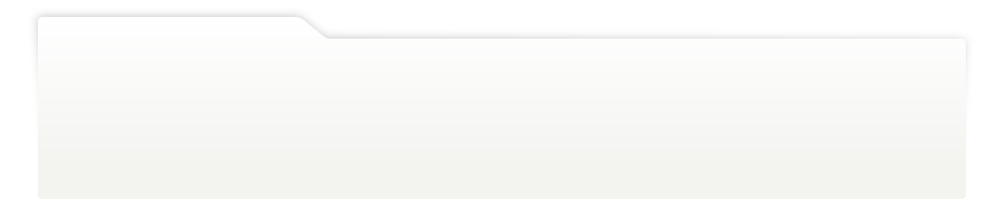
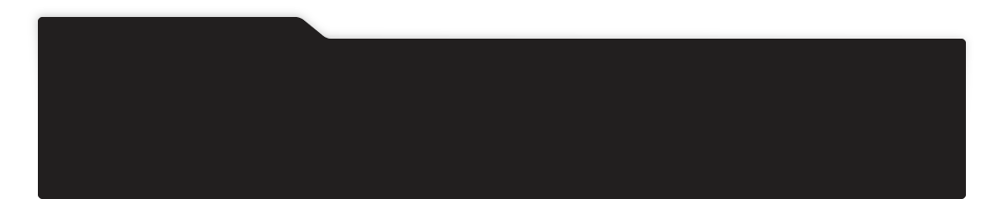
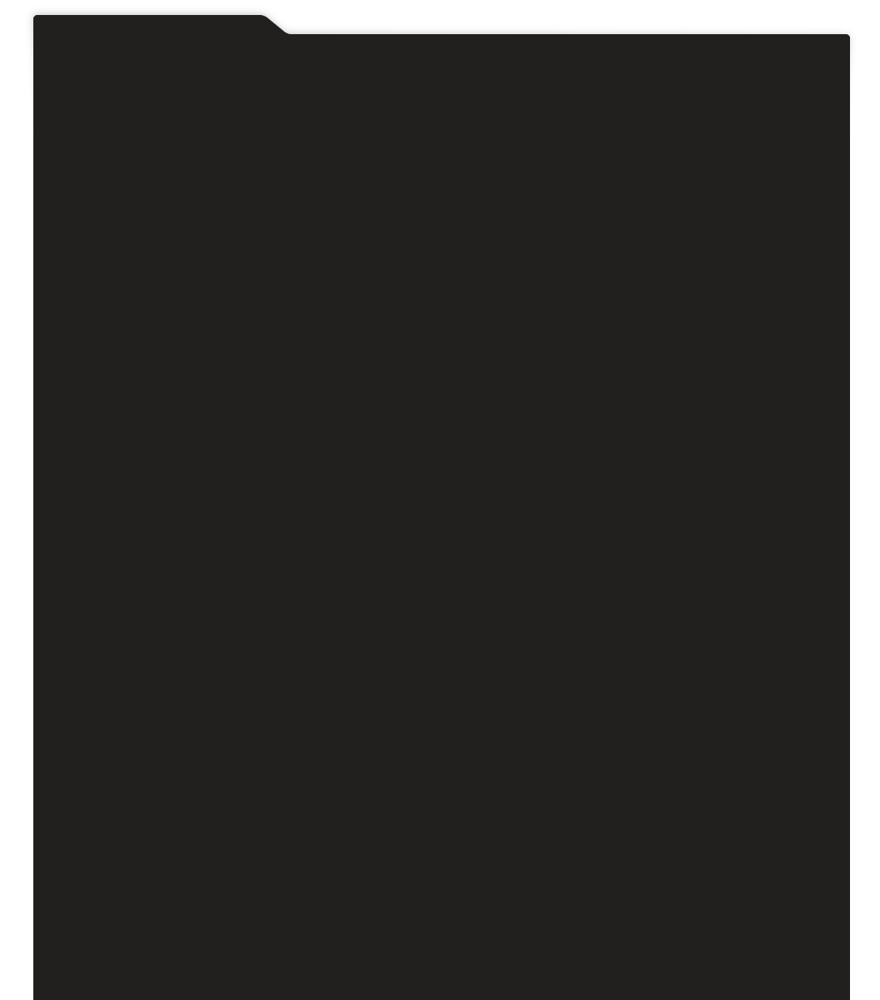
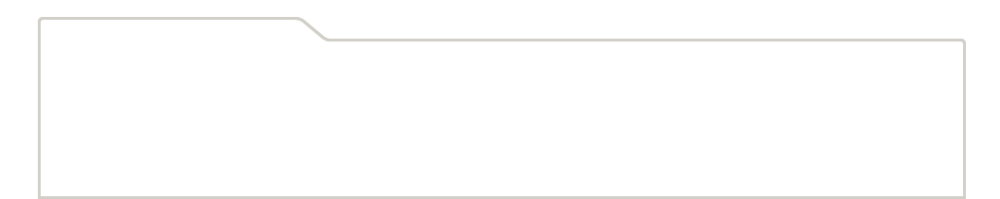
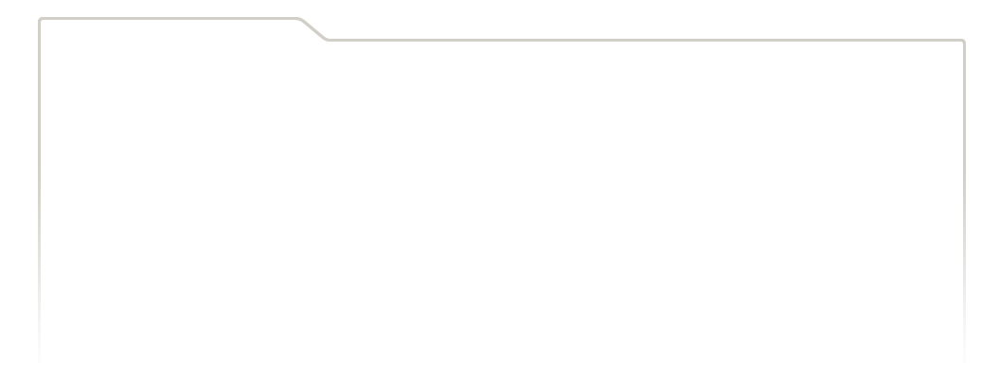
...
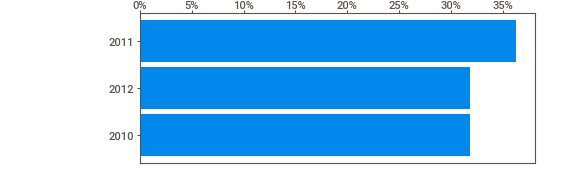
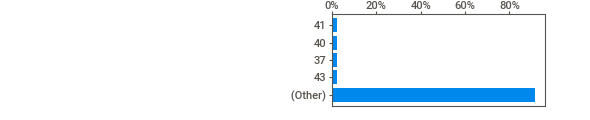
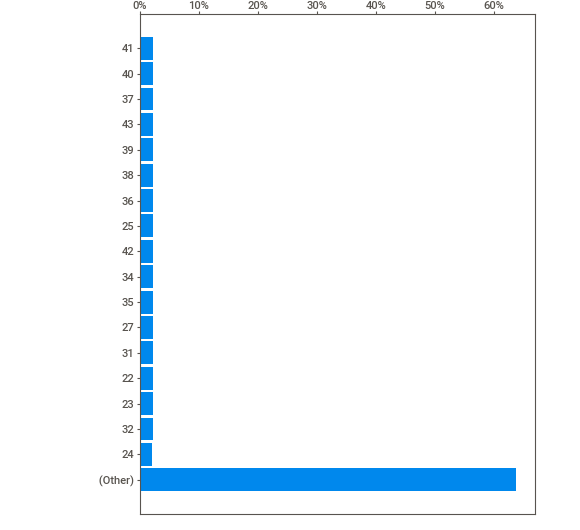
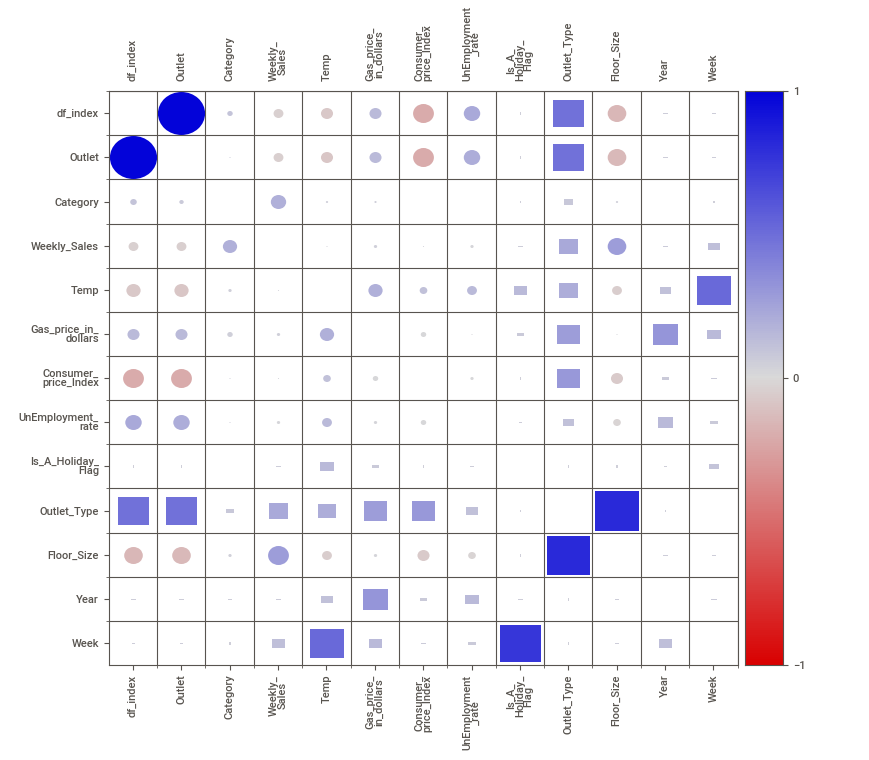
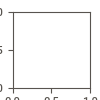

In [ ]:
# Displaying the html file in the Google Colab notebook
IPython.display.HTML('SweetViz.html')

Data Understanding:
- Outlet: Corresponding outlet/store (There are outlets from 1 to 45)
- Category: Corresponding category (There are categories from 1 to 99)
- YEARWK: Corresponding Year-week combination (There is data from the year 2010, 2011 and 2012 and weeks from 06 to 43)
- Weekly_Sales: The weekly sales at a Store-Category-YEARWK level (Range: -4,982.94 to 693,105.36)

In [ ]:
df = trainData_macroEconomicData_holidayData_outlet.copy(deep=True)
df['YEARWK'] = df['YEARWK'].astype(str)
df['Year'] = df['YEARWK'].str[:4]
df['Week'] = df['YEARWK'].str[4:]

df = df.reset_index()
df['week_date']=(df[['Year','Week']].astype(str)
                 .apply(lambda x:datetime.datetime.strptime('-W'.join(x) + '-1', "%Y-W%W-%w"),1))

In [ ]:
df_mod = df.copy(deep=True)
df.head()

,index,Outlet,Category,YEARWK,Weekly_Sales,Temp,Gas_price_in_dollars,Consumer_price_Index,UnEmployment_rate,Is_A_Holiday_Flag,Outlet_Type,Floor_Size,Year,Week,week_date
0,0,1,1,201006,24930.50,43.36,2.662,212.096358,7.606,False,A,302630,2010,06,2010-02-08
1,1,1,1,201007,46045.49,39.56,2.638,212.242170,7.606,True,A,302630,2010,07,2010-02-15
2,2,1,1,201008,41601.55,40.98,2.604,212.289143,7.606,False,A,302630,2010,08,2010-02-22
3,3,1,1,201009,19409.54,47.68,2.651,212.319643,7.606,False,A,302630,2010,09,2010-03-01
4,4,1,1,201010,21833.90,47.55,2.715,212.350143,7.606,False,A,302630,2010,10,2010-03-08


In [ ]:
df_year = df_mod.set_index(['Year'])
df_week_date = df_mod.set_index(['week_date'])

**Analyzing weekly sales aggregated at a year level (mean, sum)**

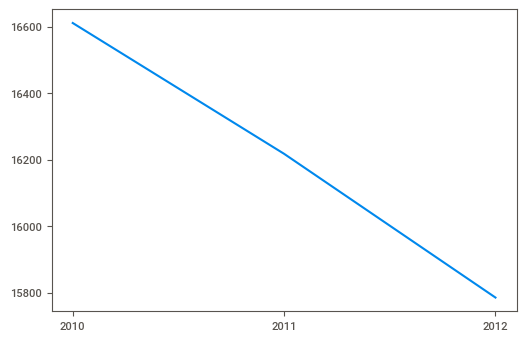

In [ ]:
plt.plot(df_year.groupby(df_year.index)["Weekly_Sales"].mean())

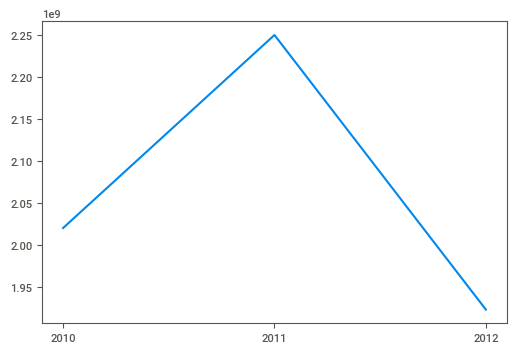

In [ ]:
plt.plot(df_year.groupby(df_year.index)["Weekly_Sales"].sum())

**Analyzing weekly sales aggregated at a week level (mean, sum)**

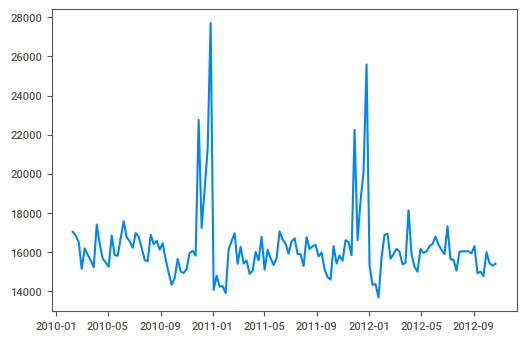

In [ ]:
plt.plot(df_week_date.groupby(df_week_date.index)["Weekly_Sales"].mean())

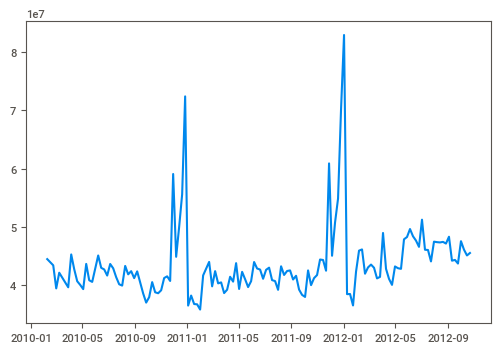

In [ ]:
plt.plot(df_week_date.groupby(df_week_date.index)["Weekly_Sales"].sum())

Now that we have done the preliminary Ecploratory Data Analysis, let's list down some of our observations:

1. There are higher weekly sales in the months of October, November and December (the highest in December) - this must  be owing to the holiday season
2. There is a high correlation between outlet type and floor size, indicating that Based on outlet type, the size must be standardized
3. One would expect that the higher the floor size, the higher should be the weekly sales, this unfortunately is not the case
4. There is a 0.01 correlation on whether a holiday and weekly sales. This indicates that a holiday is not an accurate indicator for higher sales (this may be for this synthetic dataset, in the real-world this would be a big red-flag)
5. From 2010 to 2012, we see a declining trend of mean sales (year-over-year) 

<a name="4"></a>
## 4. Case Study Analysis
Back to [Table of Contents](#0)

---

Based on the problem statement of the case-study, marks are awarded for the approach, rather than the modelling.

The metrics to consider are:
- Forecasting horizon
- Available Sales History
- Sales patterns (sporadicity, stability)
- Availability of additional features

So, below is the methodology we should follow to perform:

#### 1. **Form a baseline model**

##### Data Wrangling
* Take the Train_Data and perform preliminary analysis
* Check for missing values and outliers
* Split the YEARWK column into "Year" and "Week" and make a new column "week_date" of type datetime using the pandas package
* Make the new columns "week_date" as the index
* Account for missing values and fill in accordingly (For eg - like mode for categorical variables)

##### Feature Engineering
* For the categorical variables, namely Outlet and Category perform one-hot encoding and remove one column to avoid the Dummy Variable Trap
* For the numerical variables, in case convergence is a required metric for the chosen model, consider normalizing and standardizing the data
* Visualize the data, including seasonality, trend and noise
* Consider lag variables in case they may help increase the accuracy of the models

##### Timeseries Analysis
* Now, check if the time series is stationary (this can be done using the ADF Test (using the statsmodels-adffuller package in python)
* In case the timeseries can be made more stable, perform differencing (one or more) or exponential smoothing, as required
* We can also apply transformations such as Log Transformation to make the skewed data more normalized. It helps remove exponential variance and bings it to more acceptable ranges
* Now, the dataset that we have is ready to be modelled, here, we can use ACF and PACF to decide the p, d and q values (If not, we can start of with Auto-ARIMA)
* We can apply models such as ARIMA, SARIMA, SARIMAX

 
2. **Add New Datasets and re-model the dataset**

### Entity Relation (ER) Diagram 
(Made by Author - Anish via draw.io)
![ERDig_v1](https://github.com/anishmahapatra/DataScienceInterviewPrep/blob/main/Antuit.ai/FORECASTING-CASE-STUDY-RETAILER-X/ERDig_v1.drawio.png?raw=1)

##### Add additional datasets
- Add the additional datasets of Macro_Economic_Data, Holiday_Calendar, Outlet and Hierarchy (as required) and perform the steps under #1 again.

Here, it is critical to note that the stakeholdr expect the data at a **category-store-week** level.

We will compare this with the baseline model that we have and understand if we are getting better results and why.

3. Generate insights

Based on this, we will decide the following:
- Forecasting horizon
- Available Sales History
- Sales patterns (sporadicity, stability)
- Availability of additional features

One thing to note here is we can predict for a longer time or more accurately if we had more sales history data.

We have commented on sales patterns in our obervations and derived addtional features such as lags in our recommendations.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=a47afad5-0895-48b6-bedb-3e87dde9af8b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>